<a href="https://colab.research.google.com/github/amandalaraujo/amandalaraujo/blob/main/PDI_CC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Curso: Visão Computacional PDI

TAREFA 1

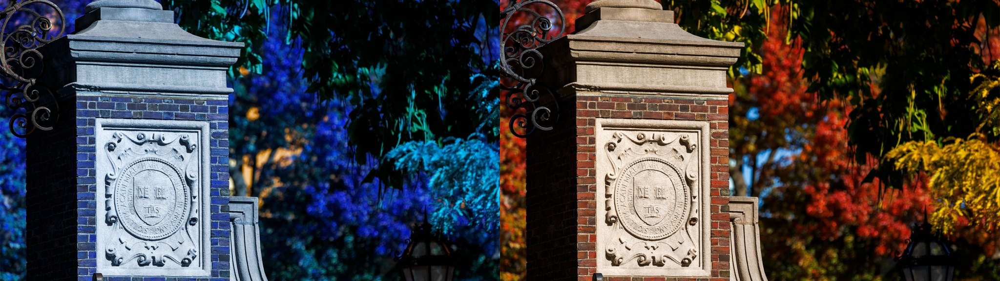

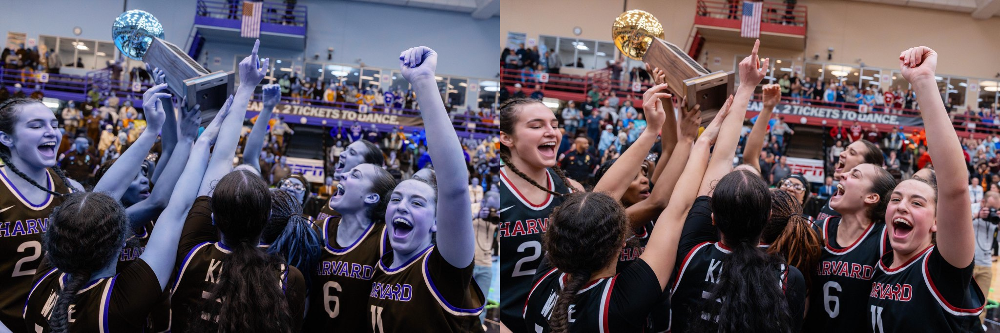

In [2]:
#TAREFA 1
import numpy as np #Importa biblioteca para usar Arrays e Matrizes
import pandas as pd #Importa biblioteca para manipulacao e analise de dados
import cv2 as cv #Importa biblioteca OpenCV --> importacao de imagens e videos
from google.colab.patches import cv2_imshow #Importar funcao para abrir imagens dentro do ambiente Colab
from skimage import io #Importa o modulo 'io' para ler imagens e urls

urls = ["https://news.harvard.edu/wp-content/uploads/2025/03/1980-Gate.jpg?resize=1024,576",
        "https://news.harvard.edu/wp-content/uploads/2025/03/Winning-champs.jpg?resize=1024,683"]

for url in urls:
  imageBGR = io.imread(url) #Le a imagem da url e carrega em formato 'bgr'
  imageRGB = cv.cvtColor(imageBGR, cv.COLOR_BGR2RGB) #Converte a imagem 'bgr' para 'rgb'
  final_frame = cv.hconcat((imageBGR, imageRGB)) #Funcao OpenCV que concatena as imagens lado a lado na horizontal
  cv2_imshow(final_frame)
  print('\n')

TAREFA 2

Carregar e exibir uma imagem


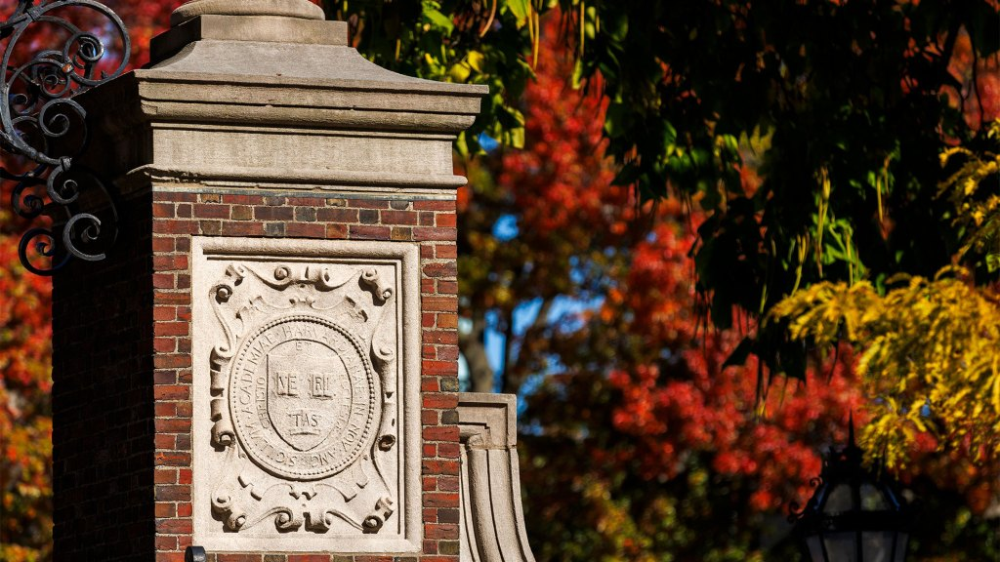


Largura da nova imagem: 1024

Matriz de Verde:
[[77 83 80 ... 16  5 14]
 [82 86 82 ... 24 10 14]
 [83 85 80 ... 36 20 18]
 ...
 [46 38 33 ... 29 27 30]
 [38 31 26 ... 26 25 28]
 [33 25 22 ... 22 21 24]]

As 3 cores do último pixel: [ 6 24 25]

Valores de azul para a linha central da imagem: [159 163 173 ...  46  71  80]

Valores de vermelho para a coluna central da imagem: [  0   0   0   0   3   5   0   0   5  18  21  10   6   7   3   0   0   1
   0   0   0   2   9  16  41  59  76  74  51  21   7   5   6   4   0   0
   0   1   4   7   0   0   0   0   0   0   0   2   5   0   0   0  12  26
  21   6   0   0   0   0   0   0   0   0   0   0   0   3   3   2   2   1
   1   0   0   0   0   0   8   9  11   0   0  11  27  30  21  13   0   0
   0   6  23  23  14   2   6   7  14  18  12   8   9  20  23  20  11   3
   4   4   7  13   0   0   0   0   0   3   6   4   9   8   5   0   0   0
   5  19   9   6  15  15   8   7   9   5   8  10  13  17  20  23  27  41
  61  52  36  22  21  26  25  20  12   

In [4]:
#1)
print('='*100)
print('Carregar e exibir uma imagem')
print('='*100)
nova_url = "https://news.harvard.edu/wp-content/uploads/2025/03/1980-Gate.jpg?resize=1024,576"
nova_imagem_BGR = io.imread(nova_url)
nova_imagem_RGB = cv.cvtColor(nova_imagem_BGR, cv.COLOR_BGR2RGB)
cv2_imshow(nova_imagem_RGB)

#2)
print('\nLargura da nova imagem:', nova_imagem_RGB.shape[1])

#3)
G_nova = nova_imagem_RGB[:,:,1]
print('\nMatriz de Verde:')
print(G_nova)

#4)
ultima_linha, ultima_coluna, _ = nova_imagem_RGB.shape
ultimos_valores = nova_imagem_RGB[ultima_linha - 1, ultima_coluna - 1]
print('\nAs 3 cores do último pixel:', ultimos_valores)

#5)
linha_central = nova_imagem_RGB.shape[0] // 2
valores_azul_linha_central = nova_imagem_RGB[linha_central,:,2]
print('\nValores de azul para a linha central da imagem:', valores_azul_linha_central)

#6)
coluna_central = nova_imagem_RGB.shape[1] // 2
valores_vermelho_coluna_central = nova_imagem_RGB[:,coluna_central,0]
print('\nValores de vermelho para a coluna central da imagem:', valores_vermelho_coluna_central)

TAREFA 3

Carregar e exibir uma imagem


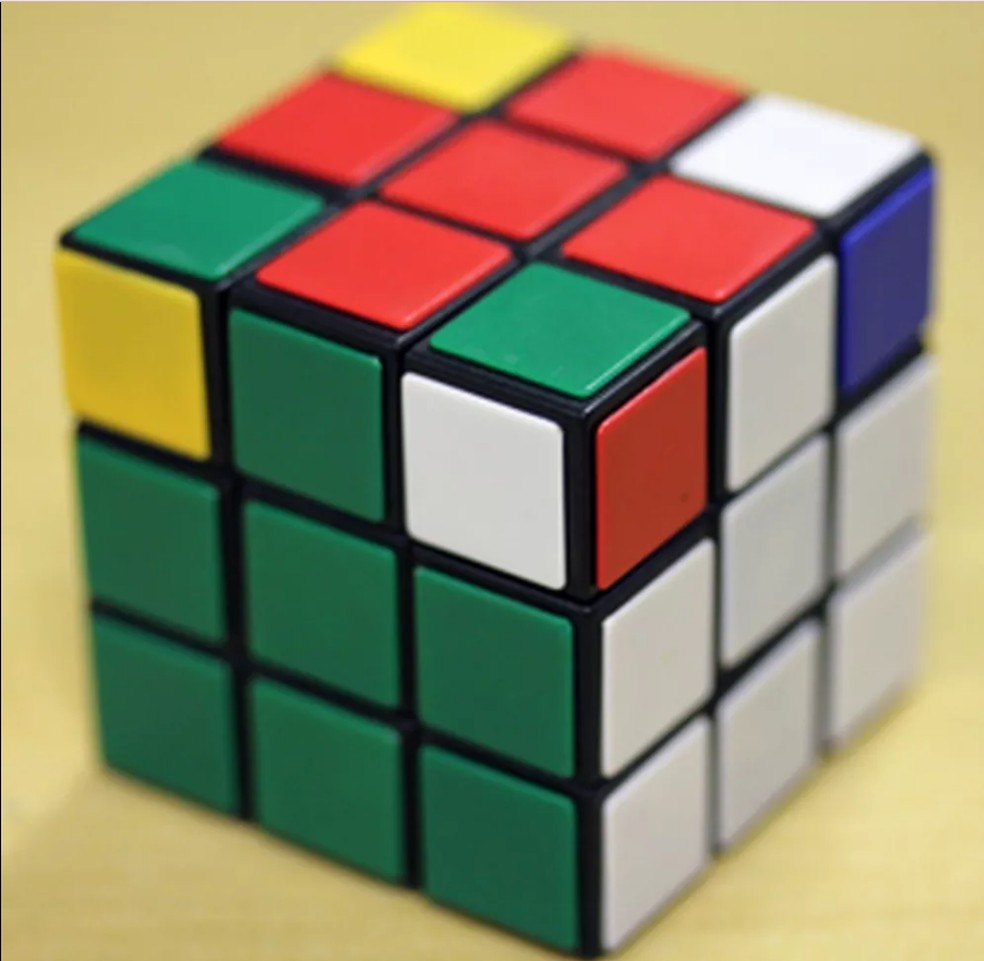

Histogramas individuais


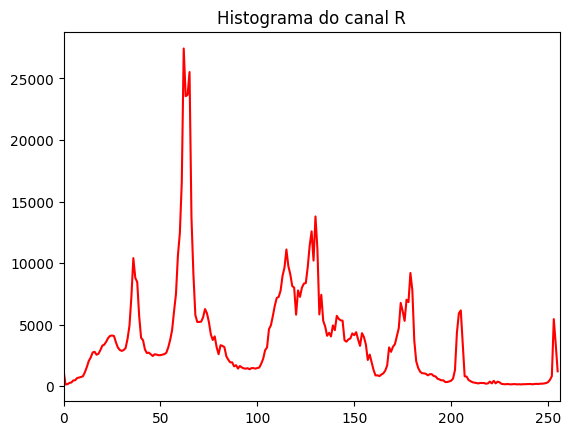

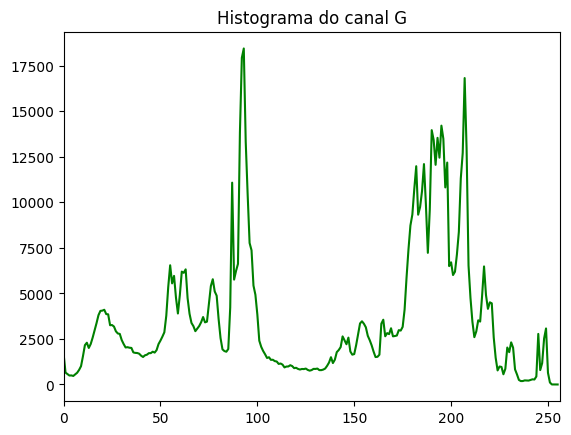

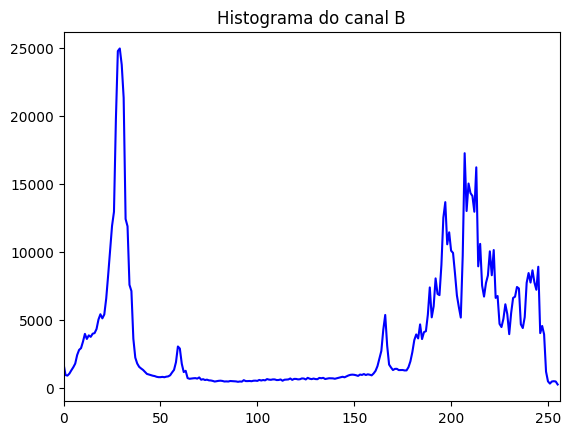

Histogramas no mesmo gráfico


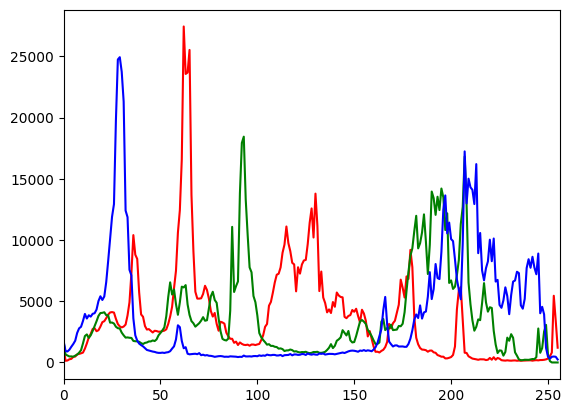

In [15]:
#FAÇA 3
print('='*100)
print('Carregar e exibir uma imagem')
print('='*100)
url = "https://s2-techtudo.glbimg.com/idyyHwq5WNVm73JNx8IPlTNnHak=/0x0:917x896/984x0/smart/filters:strip_icc()/i.s3.glbimg.com/v1/AUTH_08fbf48bc0524877943fe86e43087e7a/internal_photos/bs/2022/D/M/ydzZrMQEi0oLkM90QLkw/cubo-magico-12.png"
imagem2BGR = io.imread(url)
imagem2RGB = cv.cvtColor(imagem2BGR, cv.COLOR_BGR2RGB)
cv2_imshow(imagem2RGB)

print('='*100)
print('Histogramas individuais')
print('='*100)

# Histograma do canal R
hist = cv.calcHist([imagem2RGB],[0],None,[256],[0,256])
plt.title("Histograma do canal R")
plt.plot(hist,color = 'r')
plt.xlim([0,256])
plt.show()

# Histograma do canal G
hist = cv.calcHist([imagem2RGB],[1],None,[256],[0,256])
plt.title("Histograma do canal G")
plt.plot(hist,color = 'g')
plt.xlim([0,256])
plt.show()

# Histograma do canal B
hist = cv.calcHist([imagem2RGB],[2],None,[256],[0,256])
plt.title("Histograma do canal B")
plt.plot(hist,color = 'b')
plt.xlim([0,256])
plt.show()

print('='*100)
print('Histogramas no mesmo gráfico')
print('='*100)


color = ('r','g','b')
for i,col in enumerate(color):
    hist = cv.calcHist([imagem2RGB],[i],None,[256],[0,256])
    plt.plot(hist,color = col)
    plt.xlim([0,256])
plt.show()

TAREFA 4

Saving img2.webp to img2 (1).webp
Ler e exibir uma imagem em BGR


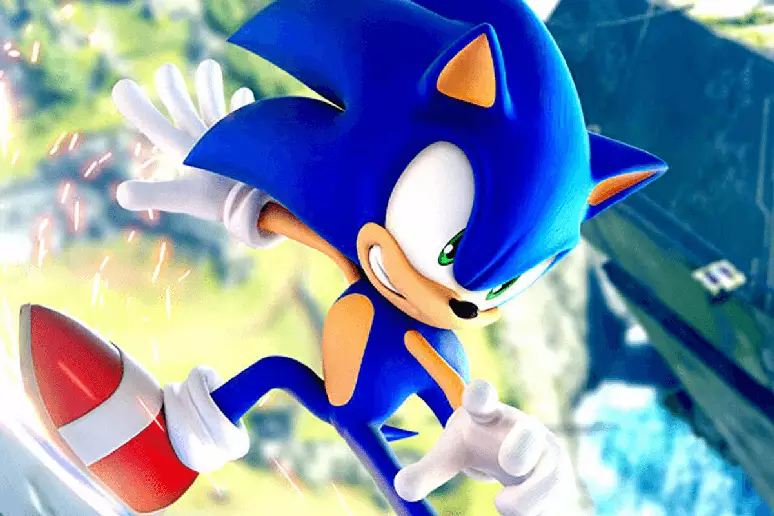

Converter uma imagem BGR para RGB e exibir em RGB - ERRADO


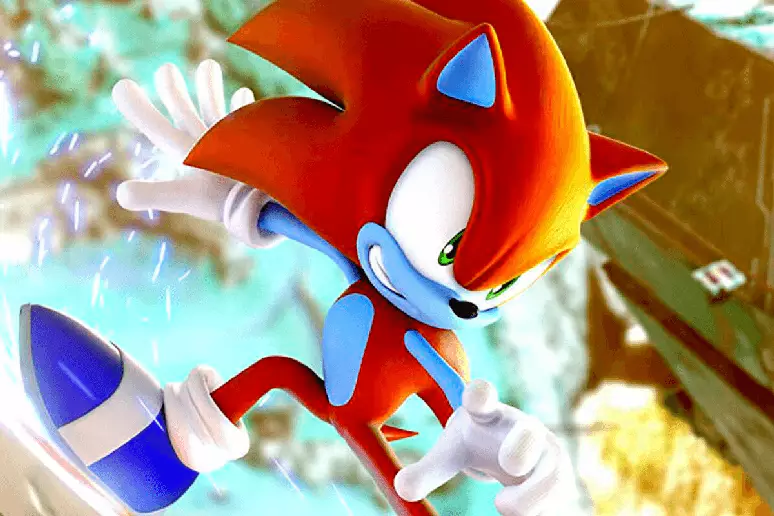

In [20]:
# Importar os módulos corretamente
import cv2
from google.colab import files
from google.colab.patches import cv2_imshow

# Carregar a imagem
uploaded = files.upload()

print('='*100)
print('Ler e exibir uma imagem em BGR')
print('='*100)

# Obter o nome do arquivo carregado
file_name = list(uploaded.keys())[0]

# Ler a imagem carregada
imagemBGR = cv2.imread(file_name)
cv2_imshow(imagemBGR)

print('='*100)
print('Converter uma imagem BGR para RGB e exibir em RGB - ERRADO')
print('='*100)

# Converter a imagem BGR para RGB e exibir (cores trocadas)
imagemRGB = cv2.cvtColor(imagemBGR, cv2.COLOR_BGR2RGB)
cv2_imshow(imagemRGB)

TAREFA 5

Saving tons-cinza.png to tons-cinza.png


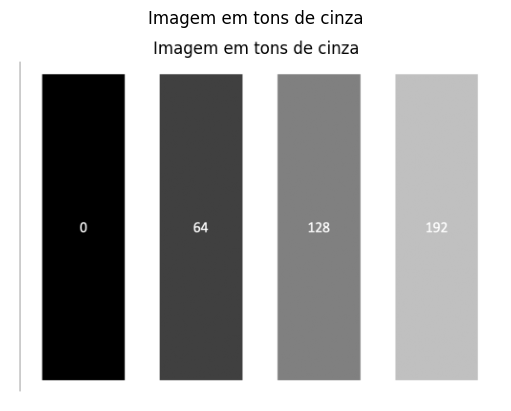

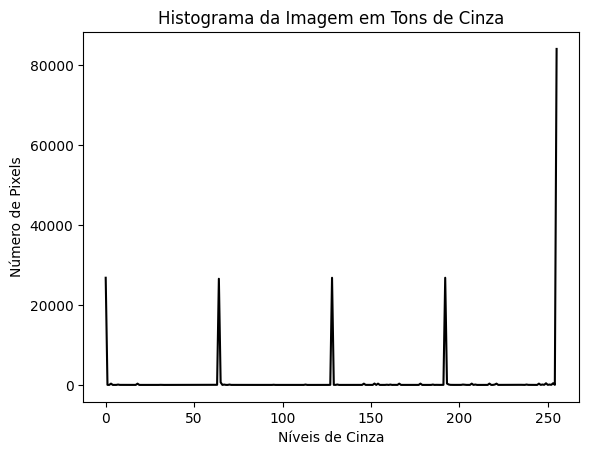

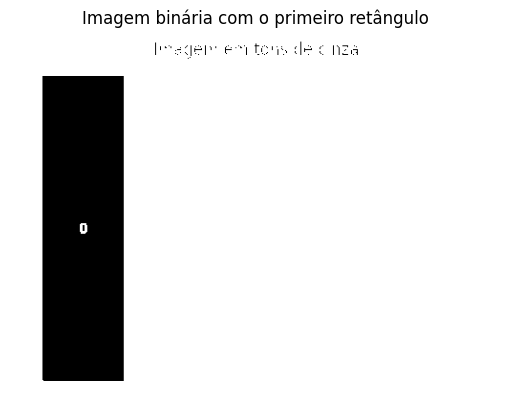

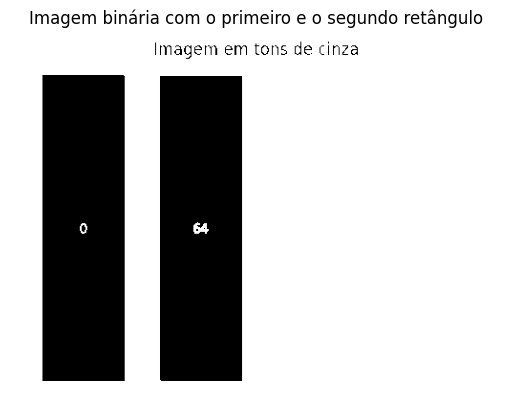

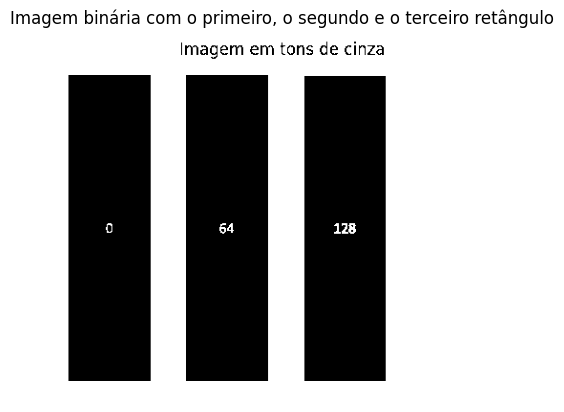

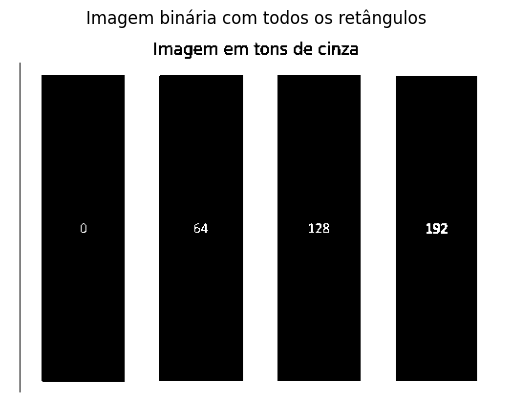

In [22]:
import cv2
from google.colab import files
import matplotlib.pyplot as plt


uploaded = files.upload()

file_name = list(uploaded.keys())[0]
imagem = cv2.imread(file_name, cv2.IMREAD_GRAYSCALE)

plt.imshow(imagem, cmap='gray')
plt.axis('off')
plt.title('Imagem em tons de cinza')
plt.show()

hist = cv2.calcHist([imagem], [0], None, [256], [0, 256])
plt.plot(hist, color='black')
plt.xlabel('Níveis de Cinza')
plt.ylabel('Número de Pixels')
plt.title('Histograma da Imagem em Tons de Cinza')
plt.show()

_, binarizada_primeiro = cv2.threshold(imagem, 10, 255, cv2.THRESH_BINARY)
plt.imshow(binarizada_primeiro, cmap='gray')
plt.axis('off')
plt.title('Imagem binária com o primeiro retângulo')
plt.show()

_, binarizada_primeiro_segundo = cv2.threshold(imagem, 70, 255, cv2.THRESH_BINARY)
plt.imshow(binarizada_primeiro_segundo, cmap='gray')
plt.axis('off')
plt.title('Imagem binária com o primeiro e o segundo retângulo')
plt.show()

_, binarizada_primeiro_segundo_terceiro = cv2.threshold(imagem, 140, 255, cv2.THRESH_BINARY)
plt.imshow(binarizada_primeiro_segundo_terceiro, cmap='gray')
plt.axis('off')
plt.title('Imagem binária com o primeiro, o segundo e o terceiro retângulo')
plt.show()

_, binarizada_todos = cv2.threshold(imagem, 200, 255, cv2.THRESH_BINARY)
plt.imshow(binarizada_todos, cmap='gray')
plt.axis('off')
plt.title('Imagem binária com todos os retângulos')
plt.show()

TAREFA 6

Saving img-cores-hsv.png to img-cores-hsv (1).png


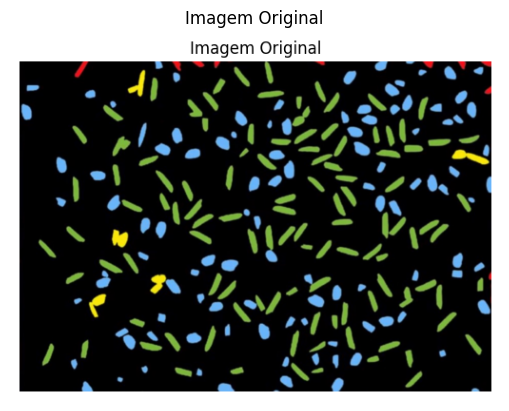

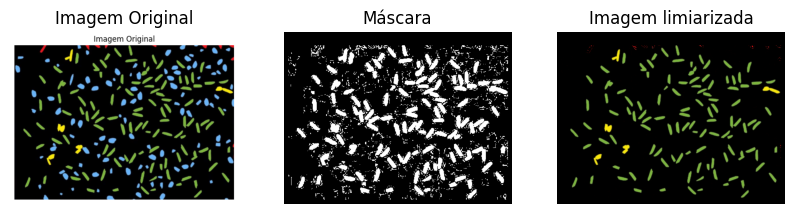

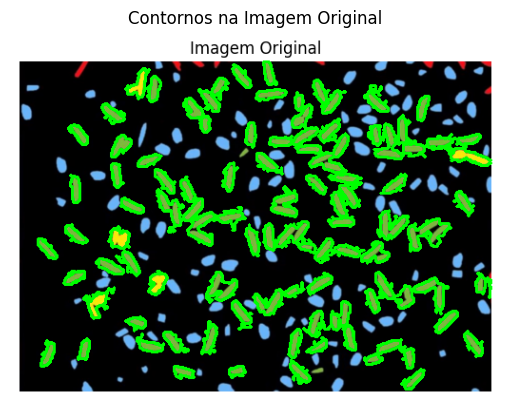

Número de objetos verdes detectados: 81


In [24]:
import cv2
import numpy as np
from google.colab import files
import matplotlib.pyplot as plt

# Importar a imagem
uploaded = files.upload()
file_name = next(iter(uploaded))

# Ler a imagem
image = cv2.imread(file_name)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Exibir a imagem original
plt.imshow(image_rgb)
plt.title('Imagem Original')
plt.axis('off')
plt.show()

# Converter a imagem para o espaço de cores HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Definir os limiares para H, S e V
lower_threshold = np.array([0, 16, 0])  # Limiar inferior para H, S, V
upper_threshold = np.array([74, 255, 255])  # Limiar superior para H, S, V

# Aplicar os limiares na imagem HSV
masked_image = cv2.inRange(hsv_image, lower_threshold, upper_threshold)

# Criar a imagem final aplicando a máscara
result_bgr = cv2.bitwise_and(image, image, mask=masked_image)

# Converter a imagem resultante para o formato RGB
result_rgb = cv2.cvtColor(result_bgr, cv2.COLOR_BGR2RGB)

# Exibir a imagem original, a máscara e a imagem resultante
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Imagem Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(masked_image, cmap='gray')
plt.title('Máscara')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result_rgb)
plt.title('Imagem limiarizada')
plt.axis('off')

plt.show()

# Encontrar os contornos na máscara binária
contours, hierarchy = cv2.findContours(masked_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

contour_image = image_rgb.copy()

# Define uma área mínima aceitável para os contornos (elimina pequenos objetos)
AREA_MIN = 100

# Filtrar contornos por área mínima
filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > AREA_MIN]

# Desenhar os contornos
cv2.drawContours(contour_image, filtered_contours, -1, (0, 255, 0), 2)

# Exibir a imagem com os contornos
plt.imshow(contour_image)
plt.title('Contornos na Imagem Original')
plt.axis('off')
plt.show()

# Número de objetos encontrados
num_objects = len(filtered_contours)
print(f"Número de objetos verdes detectados: {num_objects}")